In [1]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.21 GB, difference +0.21 GB
scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [3]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *

In [4]:
home_dir = os.path.expanduser("~")
current_directory = os.getcwd()

adata = sc.read_h5ad(current_directory+"/backups/aml_cells_umap_12062x37733_241028_19h20.h5ad")

# Initial clustering

running Leiden clustering
    finished (0:00:00)


/Users/denis/mambaforge/envs/capseq_seurat_v3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


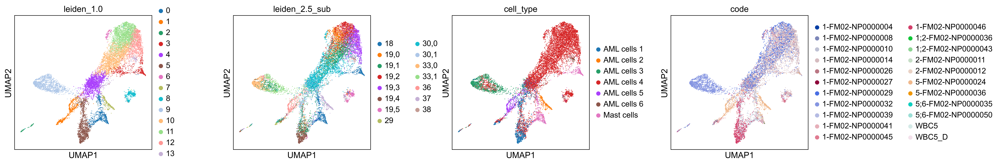

In [5]:
np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))

sc.tl.leiden(adata, flavor = "igraph", resolution = 1, key_added = "leiden_1.0", random_state = 0)
sc.pl.umap(adata[random_indices, :], color = ["leiden_1.0", "leiden_2.5_sub", "cell_type", "code"], 
           alpha = 1, 
           wspace = 0.45,
           ncols = 4,
           s = 5,
           save = "_leiden_1.0_aml.png")
#  n_iterations = 2

running Leiden clustering
    finished (0:00:00)


/Users/denis/mambaforge/envs/capseq_seurat_v3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


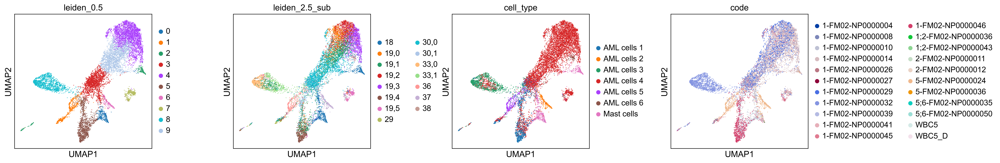

In [13]:
np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))


sc.tl.leiden(adata, flavor = "igraph", resolution = 0.5, key_added = "leiden_0.5")
sc.pl.umap(adata[random_indices, :], color = ["leiden_0.5", "leiden_2.5_sub", "cell_type", "code"], 
           alpha = 1, 
           wspace = 0.45,
           ncols = 4,
           s = 5,
           save = "_leiden_0.5_aml.png")
#  n_iterations = 2

running Leiden clustering
    finished (0:00:00)


/Users/denis/mambaforge/envs/capseq_seurat_v3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


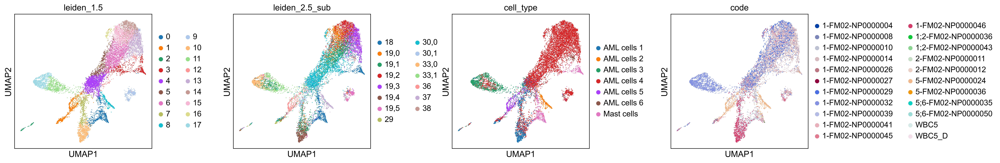

In [14]:
np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))

sc.tl.leiden(adata, flavor = "igraph", resolution = 1.5, key_added = "leiden_1.5")
sc.pl.umap(adata[random_indices, :], color = ["leiden_1.5", "leiden_2.5_sub", "cell_type", "code"], 
           alpha = 1, 
           wspace = 0.45,
           ncols = 4,
           s = 5,
           save = "_leiden_1.5_aml.png")
#  n_iterations = 2

# Subclustering

In [6]:

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0", ["8"]), 
             resolution = 0.2,
             key_added = "leiden_1.0_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0_sub", ["1"]), 
             resolution = 0.2,
             key_added = "leiden_1.0_sub")



running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)


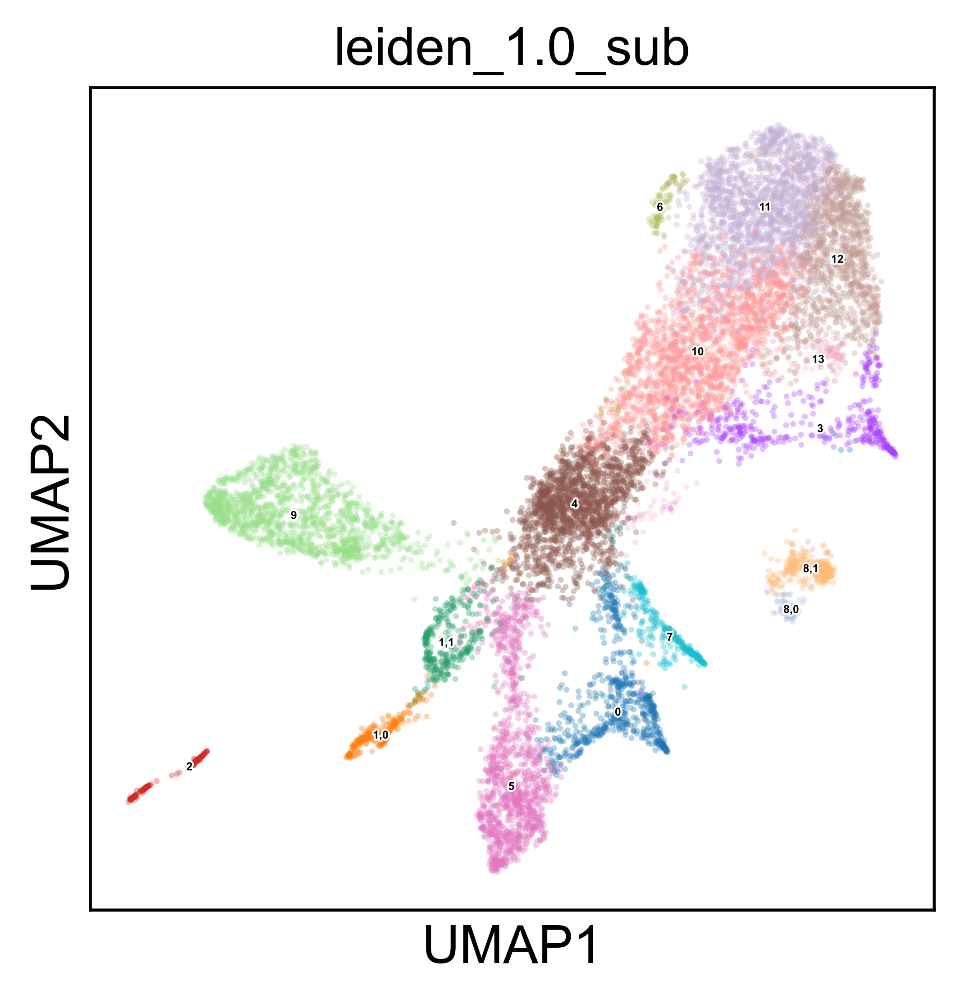

In [7]:
sc.pl.umap(adata, color = ["leiden_1.0_sub"], 
           alpha = 0.33, 
           wspace = 0.5,
           ncols = 3,
           s = 10, 
           legend_loc = "on data", legend_fontsize = 3, legend_fontoutline = True,
           save = "_leiden_1.0_sub_only_clean_aml.png")

In [9]:
# Saving obs dataframe

fname = 'backups/aml_clustering_leiden_1.0_sub_obs_%dx%d_%s'%(adata.obs.shape[0],adata.obs.shape[1],now())
print(fname)
save_df(adata.obs,fname)


backups/aml_clustering_leiden_1.0_sub_obs_12062x28_241107_09h59
